In [1]:
import numpy as np
from numpy.linalg import svd 
from numpy.fft import fftn
import sklearn
from sklearn.cluster import KMeans
from sklearn.preprocessing import normalize
import pywt
import matplotlib.pyplot as plt
from matplotlib import image
from matplotlib.colors import ListedColormap
import matplotlib.gridspec as gridspec
import os

# 5 Ways To Compress An Image

On this notebook we will present 5 ways to compress an image. The methods that we are going to use are: 

- Single Value Decomposition (SVD)
- Fourier Transform 
- Wavelets Transform
- Kmeans 
- Autoencoder

A concise explanation of the methods will be given at the beggining of each section. The idea is to show the implementation of each algorithm, we will take a very simple approach regarding the tuning of each algorithm.

In [380]:
# Load and normalize the image:

img = image.imread('cat.jpg')
img = img/255

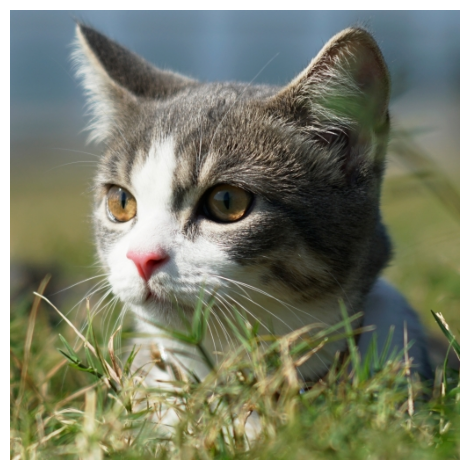

In [3]:
plt.imshow(img);
plt.axis('off')
plt.tight_layout()

In [286]:
def loss(x):
    '''A simple loss function to compute the difference between the original image and the compressed'''
    return float(f'{np.mean(np.abs(img - x)):.3f}')

# Single Value Decomposition (SVD)

In [5]:
# For a detailed explanation: 

# source: Data-Driven Science and Engineering: Machine Learning, Dynamical Systems, and Control by Steven L. Brunton  (Author), J. Nathan Kutz (Author)

SVD is probably one of the most known and used result of linear algebra, in machine learning. We can decompose a matrix $X$ in three matrices $U@S @VT = X$. The idea behind using this decomposition in image compression is to truncate the rank (r) of the matrices $U,S,VT -> U_r,S_r,VT_r$. The low rank representation of X is the aproximation of X.

In [6]:
# With numpy we can compute the SVD for a (N,M) matrix. To compute it for a (C,N,K) image, we have to apply the SVD for each channel, we will do that
#  with the help of the vectorize function

svdcolor = np.vectorize(svd, signature='(n,k)->(n,k),(n),(n,k)')
diag = np.vectorize(np.diag, signature='(m) -> (m,m)')

U,S,VT = svdcolor(img.T)
S = diag(S)

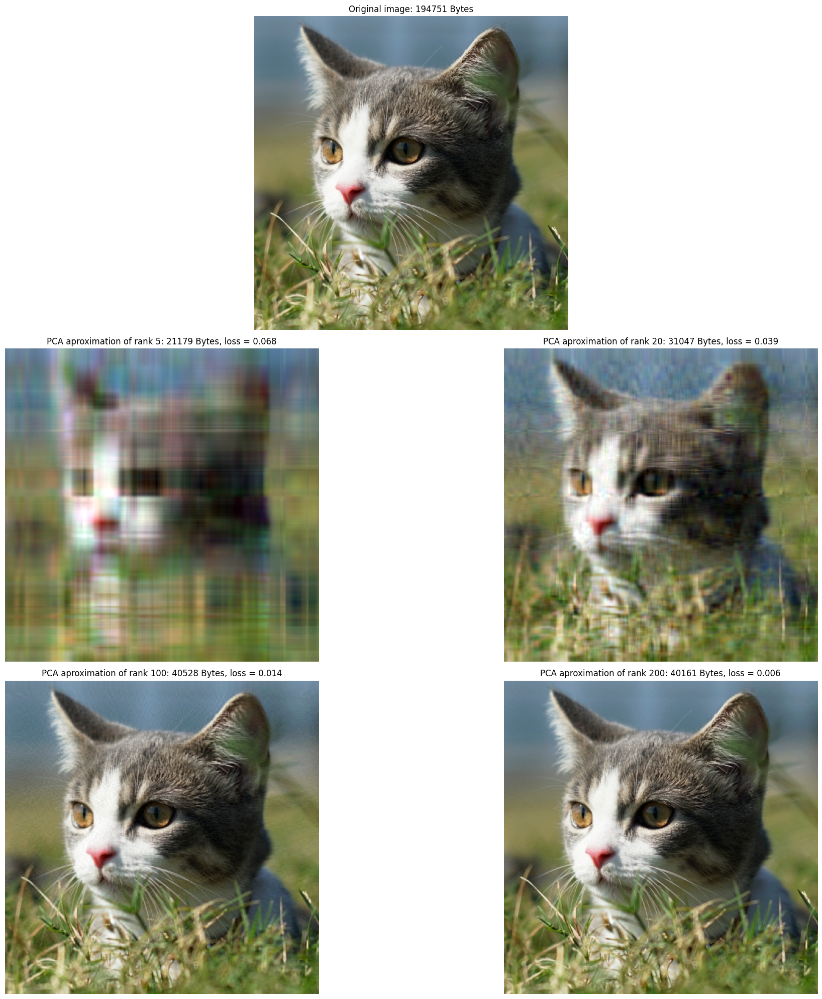

In [7]:
#Plot images and sizes

fig = plt.figure(figsize=(20,20),tight_layout=True)
gs = gridspec.GridSpec(3, 2)

a = -1
for r in [5,20,100,200]:
    a += 1 
    if a < 2:
        ax = fig.add_subplot(gs[1, a])
    else:
        ax = fig.add_subplot(gs[2, a-2])

    compimg = (U[:,:,:r]@S[:,:r,:r]@VT[:,:r,:]).T
    compimg = compimg.clip(0,1)
    image.imsave(f'PCArank{r}.jpg', compimg)
    ax.imshow(compimg)
    size = os.path.getsize(f'rank{r}.jpg')
    ax.set_title(f'PCA aproximation of rank {r}: {size} Bytes, loss = {loss(compimg)}')
    ax.axis('off')

imgor = fig.add_subplot(gs[0, :])
imgor.imshow(img)
size = os.path.getsize('cat.jpg')
imgor.set_title(f'Original image: {size} Bytes')
imgor.axis('off');

# Discrete Fourier Transform

The Fourier transform is one of the most important tools in physics, mathematics and engineering. The main ideia behind Fourier transform, and wavelets transform (next section) is to represent a L2 function in a specific basis. For the Fourier transform we use a sine, cosine basis, and for the wavelets we can choose between a higher variety of basis. To compress an image using this framework, one only needs to truncate the representation to the elements of the basis with bigger coeficients.  

In [8]:
# Numpy have a FFTn function for N-dimensional Fourier transforms

FFT = fftn(img)

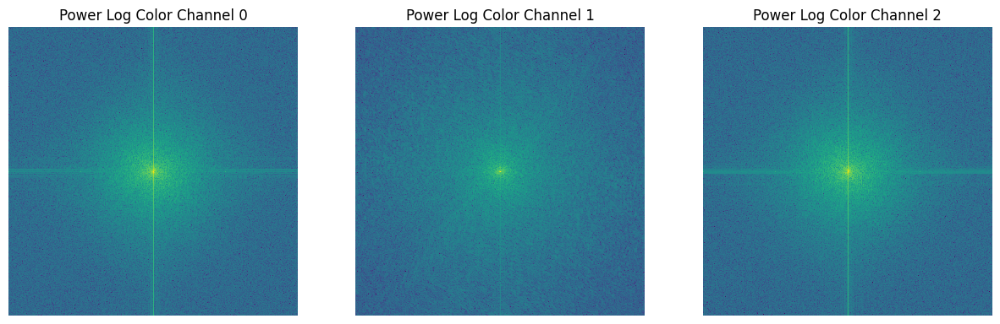

In [9]:
# We plot the absolute values of the coeficients (with smaller frequencies at the center) 

centered = np.fft.fftshift(FFT) # Shift the coeficient of 0 frequency to the center

fig, ax = plt.subplots(1,3, figsize = (15,10))
for i in range(3):

    ax[i].imshow(np.log(np.abs(centered))[:,:,i],interpolation='none')
    ax[i].set_title(f'Power Log Color Channel {i}')
    ax[i].axis('off');

For natural images the frequencies tend to be small (around the center). We can now truncated the basis at different values:

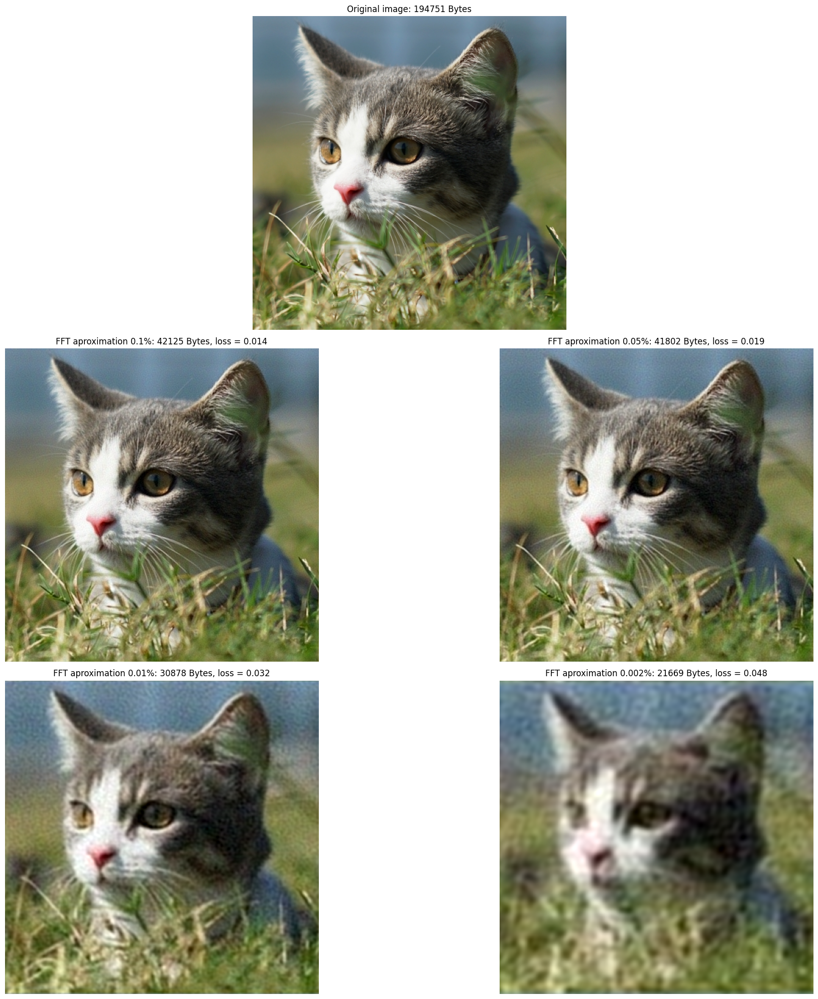

In [10]:
fig = plt.figure(figsize=(20,20),tight_layout=True)
gs = gridspec.GridSpec(3, 2, wspace = 0)

sortpower = np.sort(np.abs(FFT).reshape(-1))

a = -1
for keep in (0.1, 0.05, 0.01, 0.002): #Keep x% of the values 
    a += 1
    if a < 2:
        ax = fig.add_subplot(gs[1, a])
    else:
        ax = fig.add_subplot(gs[2, a-2])
        
    tresh = sortpower[int(np.floor((1-keep)*len(sortpower)))]
    mask = np.abs(FFT)>tresh
    FFTcomp = FFT*mask
    imgcomp = np.fft.ifftn(FFTcomp).real.clip(0,1)

    image.imsave(f'FFT{keep}%.jpg', imgcomp)
    ax.imshow(imgcomp)
    size = os.path.getsize(f'FFT{keep}%.jpg')
    ax.set_title(f'FFT aproximation {keep}%: {size} Bytes, loss = {loss(imgcomp)}')
    ax.axis('off')
    
imgor = fig.add_subplot(gs[0, :])
imgor.imshow(img)
size = os.path.getsize('cat.jpg')
imgor.set_title(f'Original image: {size} Bytes')
imgor.axis('off');

# Wavelets

Fot the wavelets, we use the module Pywavelet. The idea is the same as for FFTs:

In [11]:
# Wavedec2 function with wavelet db1 as basis

dec = pywt.wavedec2(img.T, wavelet='db1', level=1)

coef, _ = pywt.coeffs_to_array(dec, axes=[1,2])

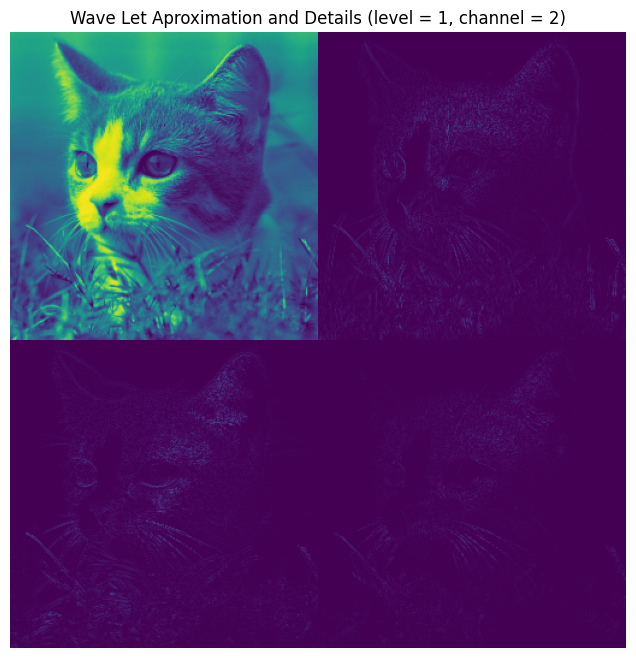

In [12]:
# Plotting the aproximate image and the missing details: 

plt.figure(figsize=(8,8))
plt.imshow(np.abs(coef.T[:,:,2])/np.abs(coef.T[:,:,2]).max())
plt.title('Wave Let Aproximation and Details (level = 1, channel = 2)')
plt.axis('off');

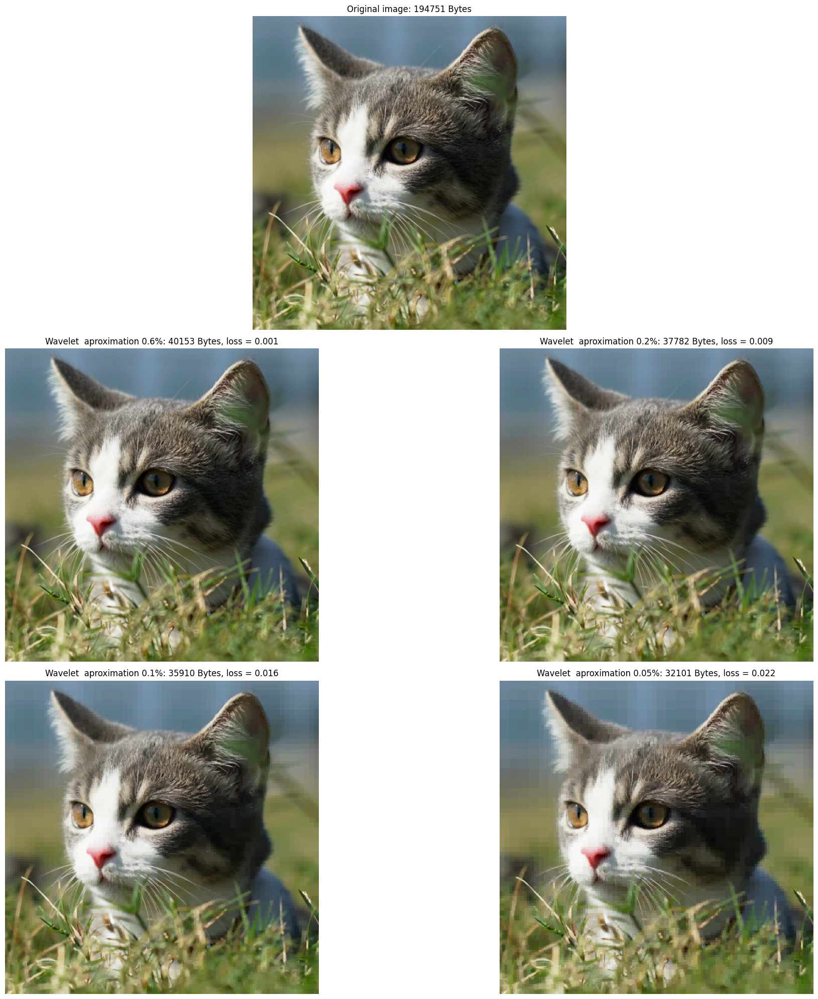

In [13]:
# Same plot as FFTs:

l = 4
w = 'db1'

dec = pywt.wavedec2(img.T, wavelet=w, level=l)
coef, slices = pywt.coeffs_to_array(dec, axes=[1,2])

fig = plt.figure(figsize=(20,20),tight_layout=True)
gs = gridspec.GridSpec(3, 2, wspace = 0)

sort = np.sort(np.abs(coef.reshape(-1)))

a = -1
for keep in (0.6, 0.2, 0.1, 0.05):
    a += 1
    if a < 2:
        ax = fig.add_subplot(gs[1, a])
    else:
        ax = fig.add_subplot(gs[2, a-2])

    tresh = sort[int(np.floor((1-keep)*len(sort)))]
    mask = np.abs(coef)>tresh
    wavecomp = coef*mask
    wavecomp = pywt.array_to_coeffs(wavecomp,coeff_slices = slices, output_format='wavedec2')
    imgcomp = pywt.waverec2(wavecomp, wavelet='db1').T.clip(0,1)

    image.imsave(f'Wavelet {keep}%.jpg', imgcomp)
    ax.imshow(imgcomp)
    size = os.path.getsize(f'Wavelet {keep}%.jpg')
    ax.set_title(f'Wavelet  aproximation {keep}%: {size} Bytes, loss = {loss(imgcomp)}')
    ax.axis('off')


imgor = fig.add_subplot(gs[0, :])
imgor.imshow(img)
size = os.path.getsize('cat.jpg')
imgor.set_title(f'Original image: {size} Bytes')
imgor.axis('off');

# KMeans

KMeans is probably the most simple algorithm in unsupervised learning for clustering. The idea is to cluster a set of points $X$ in $n$ clusters. In our case, the points represent the pixel values, and $n$ is the number of colors that we want to keep in the image.

In [14]:
nc = 5 

KM = KMeans(n_clusters=nc, n_init='auto') #sklearn KMeans function

KM.fit(img.reshape(-1,3))

KMeans(n_clusters=5, n_init='auto')

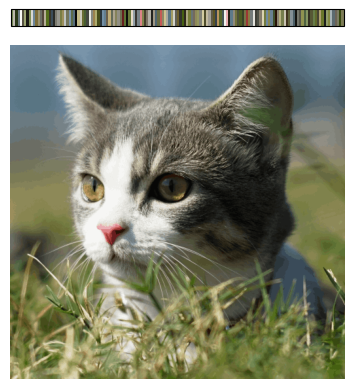

In [18]:
#Plotting KMeans (n=5), and the n-principal colors
colors = KM.cluster_centers_

plt.imshow(colors[KM.predict(img.reshape(-1,3))].reshape(512,512,3), cmap = cm)
cm = ListedColormap(colors=colors)
plt.colorbar(drawedges = False, ticks = [], location = 'top', orientation = 'horizontal', fraction = 0.045)
plt.axis('off');

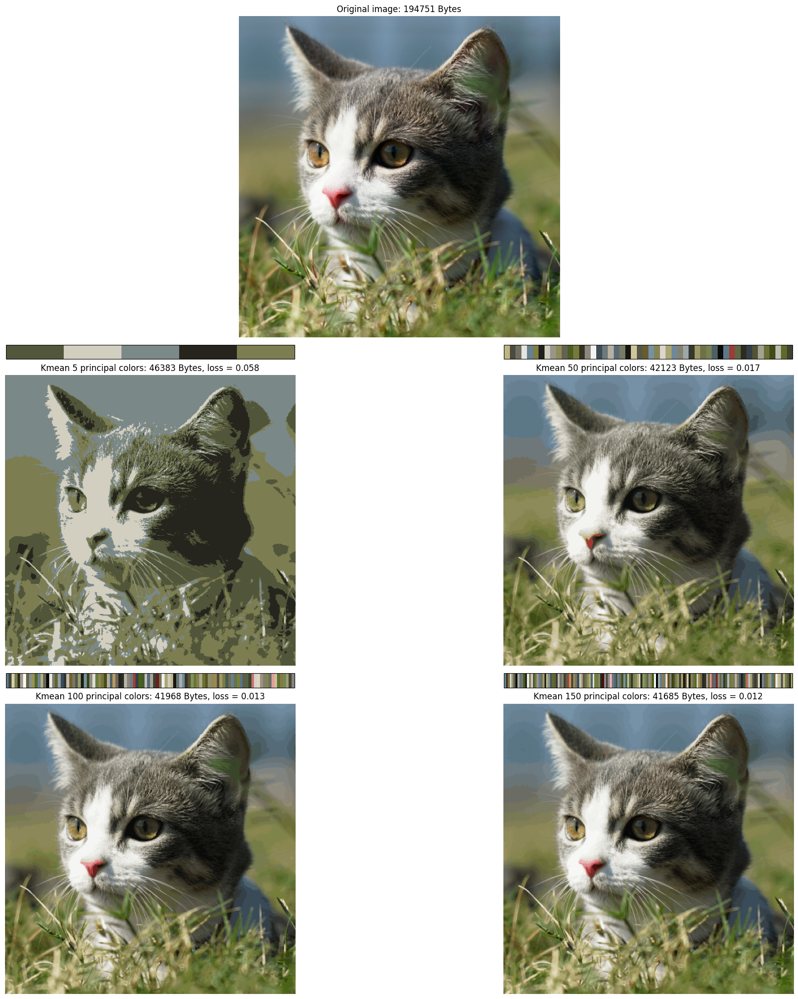

In [19]:
fig = plt.figure(figsize=(20,20), tight_layout=True)
gs = gridspec.GridSpec(3, 2)

a = -1
for nc in (5,50,100,150): 

    a += 1

    if a < 2:
        ax = fig.add_subplot(gs[1, a])
    else:
        ax = fig.add_subplot(gs[2, a-2])

    KM = KMeans(n_clusters=nc, n_init='auto')

    KM.fit(img.reshape(-1,3))
    colors = KM.cluster_centers_
    cm = ListedColormap(colors=colors)

    imgcomp = colors[KM.predict(img.reshape(-1,3))].reshape(512,512,3)

    image.imsave(f'Kmean {nc} principal colors.jpg', imgcomp)
    size = os.path.getsize(f'Kmean {nc} principal colors.jpg')
    
    x = ax.imshow(imgcomp, cmap = cm)
    plt.colorbar(x, ax=ax, drawedges = False, ticks = [], location = 'top', orientation = 'horizontal', fraction = 0.045)
    ax.set_title(f'Kmean {nc} principal colors: {size} Bytes, loss = {loss(imgcomp)}')
    ax.axis('off')

imgor = fig.add_subplot(gs[0, :])
imgor.imshow(img)
size = os.path.getsize('cat.jpg')
imgor.set_title(f'Original image: {size} Bytes')
imgor.axis('off');

# AutoEncoder Latent Space

An Autoencoder possesses a encoder that compress the input to a latent space, and a decoder that de-compress the latent space. Autoencoders are very powerful, unfortunatly they can be really expensive. For that reason we will construct a very simple autoencoder to ilustrate how it could be used to compress images. We will use a pretrained model (resnet 18 on imagenet) as an encoder, and build above it our own decoder.

In [8]:
import numpy as np
import torch
import torch.nn as nn 
from matplotlib import image
import matplotlib.pyplot as plt
from torchvision import datasets, models, transforms

In [10]:
device = torch.device('cpu')

Ideally one would train our decoder on a dataset like:

In [11]:
# transformations = transforms.Compose([transforms.PILToTensor(), transforms.Resize(size=(256,256))])

# ds = datasets.LFWPeople(root='dataset', split ='test', download = True, transform = transformations)

In our case we will only try to overfit the model to our specific image.

In [379]:
cat = torch.tensor(image.imread('cat.jpg')).permute(2,0,1).view(1,3,512,512)/255

dl = torch.utils.data.DataLoader(img)

We will only use the resnet layers, in other words we will completly neglect the residual structure (for better performance consider adding the residual structure to the forward pass). Even with such a naive approach to the transfer leraning, the model behaves well.

In [178]:
class Model(nn.Module):

    def __init__(self):
        super(Model,self).__init__()
        pretrained = models.resnet18(weights='ResNet18_Weights.IMAGENET1K_V1')

        for param in pretrained.parameters():
            param.requires_grad = False

        pretrained.eval()

        self.encoder = nn.Sequential(*list(pretrained.children())[:7])
        self.decoder = nn.Sequential(
        nn.ConvTranspose2d(256,128,kernel_size=(2,2), stride=(2,2), bias=False),
        nn.BatchNorm2d(128),
        nn.ReLU(),
        nn.ConvTranspose2d(128,64,kernel_size=(2,2), stride=(2,2),bias=False),
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.ConvTranspose2d(64,32,kernel_size=(2,2), stride=(2,2),bias=False),
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.ConvTranspose2d(32,3,kernel_size=(2,2), stride=(2,2),bias=False),
        nn.BatchNorm2d(3),
        nn.Sigmoid(),
        )

    def forward(self, input):
        output = self.encoder(input)
        output = self.decoder(output)

        return output

In [189]:
model = Model()
model.to(device);

In [403]:
sum(p.numel() for p in model.parameters() if p.requires_grad == True) # Resnet have freezed layers

172870

In [263]:
#Loss and Optim

loss_fn = nn.BCELoss()
optim = torch.optim.Adam(params = model.parameters(), lr = 0.001)

In [308]:
# Training Loop

epochs = 100

def training(model):

    hist_train = []

    for i in (range(epochs)):

        total_loss_train = 0
       
        #Training loop
       
        for batch in dl:

            model.train()
            model.encoder.eval()

            batch = batch.to(device)
            output = model(batch)

            loss = loss_fn(output,batch)

            optim.zero_grad()
            loss.backward()
            optim.step()

            total_loss_train += loss.item()
            hist_train = np.append(hist_train,loss.item())

        # if i % 10 == 0:

            # print(f'Epoch({i+1}/{epochs}) : Total loss = {total_loss_train:.5f}')

    return hist_train
    

In [316]:
_ = training(model)

In [326]:
torch.save(model.state_dict(), 'modelstate')

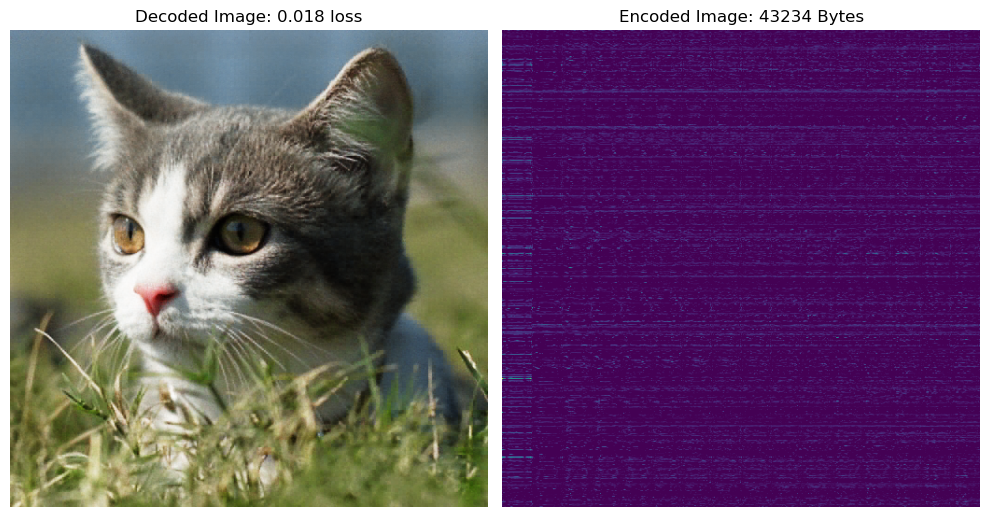

In [397]:
fig, ax = plt.subplots(1,2, figsize=(10,10), tight_layout=True)

with torch.no_grad():
    model.eval()
    x = (model(cat))

    ax[0].imshow(x[0].data.permute(1,2,0))
    ax[0].set_title(f'Decoded Image: {loss(x[0].data.permute(1,2,0).numpy())} loss')
    ax[0].axis('off');
    decodedimage = x[0].data.permute(1,2,0).numpy()
    image.imsave('decodedimage.jpg', decodedimage)
    encodedimg = model.encoder(cat)[0].view(512,512)
    image.imsave('encodedimg.jpg', encodedimg)
    size = os.path.getsize('encodedimg.jpg')

    ax[1].imshow(encodedimg)
    ax[1].set_title(f'Encoded Image: {size} Bytes')
    ax[1].axis('off');

# Conclusions

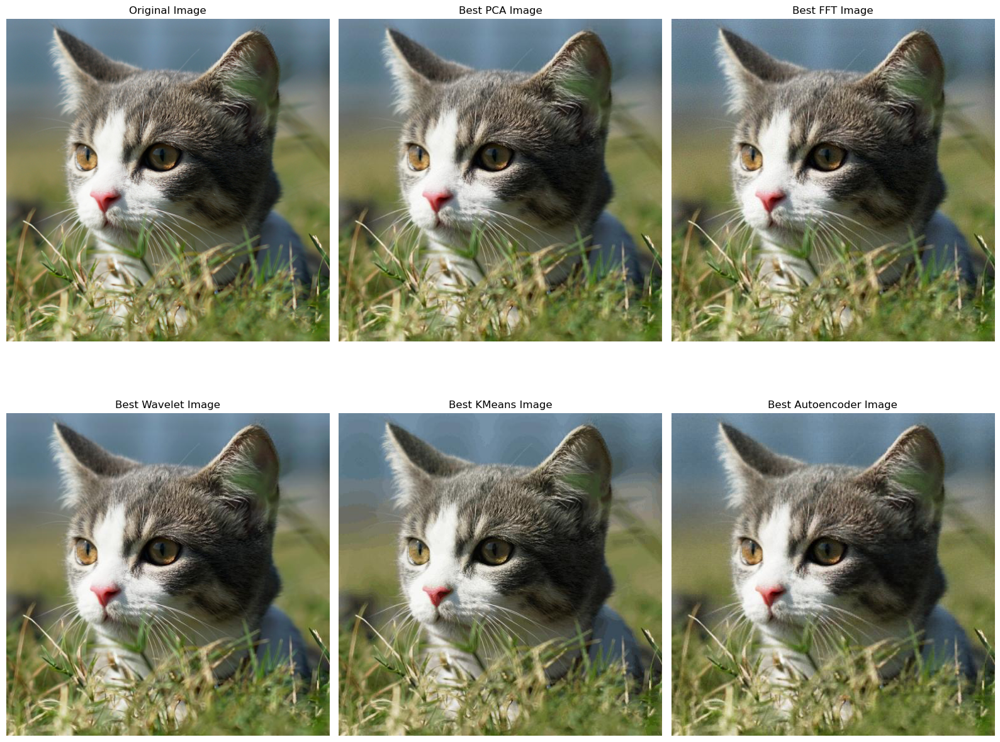

In [402]:
fig, ax = plt.subplots(2,3, figsize=(16,16),tight_layout=True)

bestpca = image.imread('PCArank200.jpg')
bestfft = image.imread('FFT0.1%.jpg')
bestwave = image.imread('Wavelet 0.6%.jpg')
bestkm = image.imread("Kmean 150 principal colors.jpg")
bestauto = image.imread('decodedimage.jpg')

ax[0,0].imshow(img)
ax[0,0].axis('off')
ax[0,0].set_title('Original Image')
ax[0,1].imshow(bestpca)
ax[0,1].axis('off')
ax[0,1].set_title('Best PCA Image')
ax[0,2].imshow(bestfft)
ax[0,2].axis('off')
ax[0,2].set_title('Best FFT Image')
ax[1,0].imshow(bestwave)
ax[1,0].axis('off')
ax[1,0].set_title('Best Wavelet Image')
ax[1,1].imshow(bestkm)
ax[1,1].axis('off')
ax[1,1].set_title('Best KMeans Image')
ax[1,2].imshow(bestauto)
ax[1,2].axis('off')
ax[1,2].set_title('Best Autoencoder Image');


The Wavelet compression was the best one with a loss of 0.001, size of 40153 Bytes, and unnoticed changes to the naked eye. The PCA compression was a little better than the FFT with a loss of 0.006, and size of 40161 Bytes aggainst 42125 Bytes and loss 0.014 for the FFT. The FFT showed a more pleasing image degradation, with a grainy aspect. The PCA, on the other hand, showed a more pixelized degradation. The KMeans had the worst performance, with strange color effects. The autoencoder image could be improved much more with a better tuning and model, but even with such a naive approach showed very promising result.
